<a href="https://colab.research.google.com/github/markorakic777/PPPO/blob/main/ProjekatPPPO_MarkoRakicIT6g2019.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


**Uvod**

U ovom projektu je ispitana i suboptimozovana performantnost različitih klasifikacionih modela prilikom klasifikacije slika LEGO kocki iz dobijenog dataset-a.

Problem je bio klasifikacione prirode - odrediti koja od 38 figura se nalazi na slici iz testnog seta (seta podataka na kom model nije treniran i validiran). Kako je deo slika obeležen, problem je u oblasti *nadgledanog učenja*.

Željeni izlaz bio je suboptimizacijom postojećih modela napraviti nov model koji će rešiti problem sa što boljim performansama.



**Pristup rešavanju problema**

Pregledom literature, dođeno je do zaključka da se ovakvi problemi rešavaju upotrebom klasifikacionih modela tipa CNN mreže.

Proces ispitivanja pretreniranih CNN mreža i suboptimizacije prati standardne korake:

1. Istraživanje karakteristika ulaznih podataka
2. Odabir klasifikacionih mod ela koji će biti kasnije korišćeni (i grub odabir njihovih parametara)
3. Priprema podataka za obradu u modelu
4. Instanciranje i konfigurisanje različitih CNN modela
5. Treniranje odabranih modela
6. Evaluacija performansi odabranih modela
7. Suboptimizacija modela koji se najbolje pokaže
8. Prikaz rada suboptimizovanog modela na testnom setu podataka.


Za potrebe ovog projekta, izabrano je da se intezivnijie tehnike suboptimizacije modela primene isključivo na pretrenirani model koji pokaže najbolje performanse. Za pretrenirane modele koristi će se samo manuelno podešavanje parametara.

Korišćene tehnologije:

1. programski jezik Phyton: Ovaj programski jezik, pored programskog jezika R, predstavlja industrijski standard u radu sa problemima ove vrste. Razlog za korišćenje ovog jezika je njeogva jednostavnost ali i velika podrška za specifične potrebe velikog broja algoritama mašinskog učenja (npr. TensorFlow biblioteke)

2. razvojno okružene Google Colab: Ovo okruženje pored toga što je besplatno, znatno olakšava saradnju u pisanju koda, prilično je pregledno i koristi udaljene računarkse resurse što odgovara zahtevima projekta.

Odabrane pretrenirane CNN mreže bile su: VGG19, Google Inception, Restnet i DenseNet

**Istraživanje karakteristika dobijenih podataka**

Korišćen set podataka sadrži 371 obeleženih slika LEGO figurice likova iz popularnih filmova i serija poput "Jurassic Park", "Star Wars", "Harry Potter" i "Marvel" sveta.

Prvi korak u projektu je  detaljna analiza svojstava podataka, kako bi se na osnovu njih donele odluke o korišćenju odgovarajućih CNN modela, i usmerio tok data preprocessing-a.



**Korišćene biblioteke**

In [5]:
import numpy as np
import random
import pandas as pd
import os
import matplotlib.pyplot as plt
import cv2
import imgaug as ia
from imgaug import augmenters as iaa
import glob
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, VGG16, DenseNet121, InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import regularizers
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.applications import DenseNet121
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense
from keras.models import Sequential
from keras.layers import Dropout
from tensorflow.keras.optimizers import Adam

**Učitavanje podataka**

Dataset je unzipovan, zatim okačen na oblak "Google Drive".

Prvi korak je kopiranje apsolutnih google drive putanja csv-fajlova i njihovo čuvanje u odgovarajućim promenjivima.

Drugi korak je pravljanje dataframe-ova na osnovu putanja csv fajlova.

In [4]:
#čuvanje apsolutnih google drive putanja csv-fajlova
index_path = r"/content/drive/MyDrive/project/index.csv"
metadata_path = r"/content/drive/MyDrive/project/metadata.csv"
test_path = r"/content/drive/MyDrive/project/test.csv"

#pravljenje dataframe-ova za csv fajlove
index_df = pd.read_csv(index_path)
metadata_df = pd.read_csv(metadata_path,encoding='latin1')
test_df = pd.read_csv(test_path)



Sledi spajanje index df-a sa metadata df-om. Na ovaj način će se povezati podaci o putanji slike sa njenom klasom - dobiće se obeležena kolekciju podataka*


In [5]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


U narednom koraku, izvršiće se agregacija podataka po nazivu figure (klase). Kao agregiran podatak prikazaće se broj redova u početnom datasetu koji je imao zadatu vrednost naziva figure. (vrši se count po nazivu figure)

Drugim rečima, prebrojaće se koliko svaka klasa ima slika u dobijenom setu podataka. (1 red predstavlja jednu sliku)

Ovo radimo da bi smo utvrdili balansiranost seta podataka.

Balansiranost seta podataka, u ovom kontekstu, predstavlja veličinu koja opisuje distribuciju podataka po klasama.

Što je ta distribucija ujednačenija, tj što je manje razlike u broju podataka po klasama, očekuje se da će performanse modela biti bolje.


In [6]:
agregated_data_df = data_df.groupby('minifigure_name').size().reset_index(name='count')
agregated_data_df

,minifigure_name,count
0,ANAKIN SKYWALKER,9
1,AUNT MAY,10
2,BLACK WIDOW,11
3,BOBA FETT,10
4,CAPTAIN AMERICA,10
5,CARA DUNE,7
6,DARTH VADER,9
7,EMPEROR PALPATINE,10
8,FIREFIGHTER,8
9,GENERAL GRIEVOUS,12


Sada će se prikazati balansiranost vizualno, upotrebom plt biblioteke

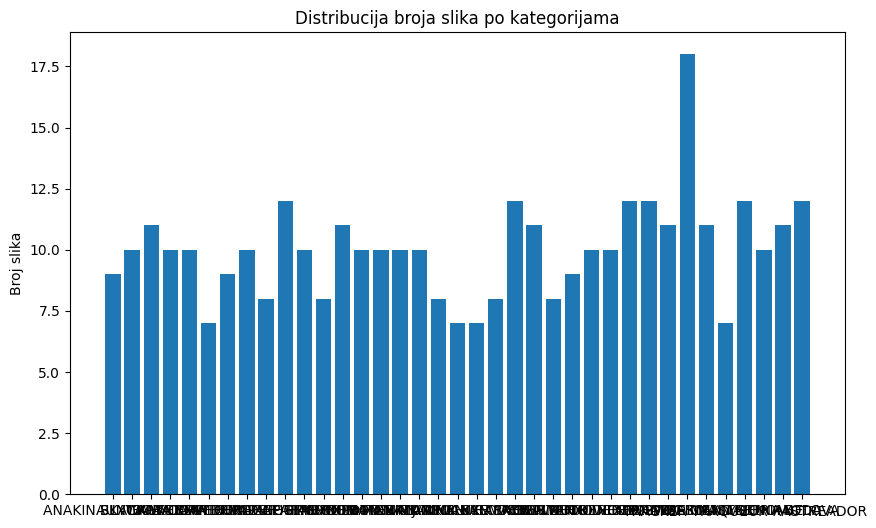

In [7]:


plt.figure(figsize=(10, 6))
plt.bar(agregated_data_df['minifigure_name'].values, agregated_data_df['count'].values)
plt.ylabel('Broj slika')
plt.title('Distribucija broja slika po kategorijama')
plt.show()


iz priloženog grafika vidi se dataset nije balansiran. Zato će se kategorije izbalansirati kroz regularizacionu tehniku augmentacije


**Augmentacija**

Ovo je proces pravljenja novih slika sa dodatim "efektom" (blur, iskrivljenje, inverzija...) unutar klasa koje imaju manje slika kako bi se postigla balansiranost i sprečila pojava "overfitting"-a


In [8]:
#augmenter je objekat koji sadrži metode za augmentaciju slika. Metode koje će se koristiti smo mi definisali kroz konstruktor tog objekta.
# cela logika ce se vrsiti samo jeendom, zato je stavljen if false - da ako slucajno ponovo pokrenemo ovu celiju, da se ne naprave slike ponovo.

if 0:
  augmenter = iaa.Sequential([
          iaa.Flipud(0.5),  # Okreni sliku vertikalno, sa verovatnoćom od 50%.
          iaa.Affine(rotate=(-20, 20)),  # Zarotiraj sliku za -20 do 20 stepeni
          iaa.GaussianBlur(sigma=(0, 1.0))  # Dodaj zamućenje "stepena" od 0 do 1 (GaussianBlur)
      ])

  #augmentovane slike ce se sacuvati na lokaciji output_folder,
  output_folder_path = r"/content/drive/MyDrive/project/augmented"
  os.makedirs(output_folder_path, exist_ok=True) #napravi folder na datoj lokaciji, ako on već nije napravljen

  #augmentovace se samo slike iz 10 kategorija koje imaju najmanji broj slika.
  #zato cemo sortirati agregated_data_df po broju slika po klasi rastuce i odatle uzeti prvih 10 klasa, i njihove nazive smestiti u np niz.

  sorted_ageregated_data_df = agregated_data_df.sort_values('count', ascending=True).head(10)
  categories_to_augment=sorted_ageregated_data_df['minifigure_name'].values
  categories_to_augment=np.array(categories_to_augment)
  #print(categories_to_augment)


  filtered_data_df = data_df[data_df['minifigure_name'].isin(categories_to_augment)]
  #print(filtered_data_df)

  index_int=0 #ovo je pomocna tranzijentna promenjiva.

  for image_file_path, class_id, minifigure_name in zip(filtered_data_df['path'], filtered_data_df['class_id'], filtered_data_df['minifigure_name']):
                  image_file_path=os.path.join("/content/drive/MyDrive/project",image_file_path)
                  image = cv2.imread(image_file_path)

                  #napravi izmenjenu verziju slike / augmentovanu sliku
                  augmented_image = augmenter.augment_image(image)

                  # Pronadji tacnu putanju na koju ces sacuvati sliku
                  index_int+=1
                  index=str(index_int)
                  index+=".jpg"

                  output_file_path = os.path.join(output_folder_path, index)

                  # Sacuvaj sliku na prethodno definisanoj putanju
                  cv2.imwrite(output_file_path, augmented_image, [cv2.IMWRITE_JPEG_QUALITY, 100])

                  # u narednim koracima, azurirace se data_df kako bi mu se dodale nove augmentovane slike

                  new_row = {'path': output_folder_path, 'class_id': class_id, 'minifigure_name': minifigure_name}
                  data_df.append(new_row, ignore_index=True)



**Podela podataka na validacioni set i set za trening**

U algoritmima mašinskog učenja postoje dve faze:
1. trening: model u ovoj fazi identifikuje obrasce na slikama specificne za svaku klasu.
2. validacija: u ovoj fazi se na osnovu obeleženih podataka proverava sa kojom uspešnošću će model izvršiti zadatak. Kako su podaci obeleženi tj njihova realna klasa poznata to će biti moguće (uspešno je ako se klasa koju je model idnetifikovao i stvarna klasa poklapaju)

za prvu fazu se koristi 80 posto podataka a za drugu 20 (ukoliko bi model evaluirao svoje performanse na podacima na kojima je učio uvek bi pogodio, zato moramo odvojiti 20 odsto obeleženih podataka na kojima ćemo evaluirati uspešnost modela)


In [9]:

y_data = data_df['class_id'] # ovo su klase svake slike
X_data = data_df.drop(columns = ['class_id']) #ovo je dataframe koji sadrzi putanju i ime klase.

# u sledecoj liniji slučajnim*** izborom ćemo uzeti 20% podataka za validaciju, a ostatak ćemo koristii za trening
# random_state je parametar koji je "seme" za RNG algoritme, i označava "pravilo po kojim se vrši izbor slika za val set" (nije toliko slučajan :D))
# random_state nam omogućava da će uvek dobijemo slične performanse jer je model napravljen na osnovu istih trening podataka. treba ga prilagoditi slučajnim pogađanjem tako da performanse  modela budu najbolje
X_train, X_val, y_train, y_val= train_test_split(X_data, y_data, test_size=0.2, random_state=8)



Primetiti da i dalje ne radimo sa bajtovima slika, već sa putanjama. zato će se napraviti nov niz u kom će biti slike u odgovarajućem foramtu, izražene u bajtovima.


In [10]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))

for i in range(X_train.shape[0]):
    image_path = os.path.join( "/content/drive/MyDrive/project" ,X_train["path"].values[i])
    image = cv2.imread(image_path) #pretvori sliku na datoj lokaciji u niz bitova
    image = cv2.resize(image, dsize=(224,224)) # resize-uj sliku ako nije 224x224
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #stavi da uvek budu 3 kanala, u redosledu RGB
    X_train_converted[i] = image/255 #normlalizuj itnezitete piksela slike tako da budu između 0 i 1

y_train_converted = np.array(y_train)-1  #pretvaramo svaki string u neki broj, jer je tako lakse za rad.


Isto treba uraditi sa val setom

In [11]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))

for i in range(X_val.shape[0]):
    image_path = os.path.join( "/content/drive/MyDrive/project" ,X_val["path"].values[i])
    image = cv2.imread(image_path)
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_val_converted[i] = image/255

y_val_converted = np.array(y_val)-1

print(len( y_val_converted))

75


Ostaje jos priprema testnih podataka





In [12]:
y_test = test_df['class_id']
X_test = test_df.drop(columns = ['class_id'])
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))

for i in range(X_test.shape[0]-1):
    image_path = os.path.join( "/content/drive/MyDrive/project" ,X_test["path"].values[i])
    image = cv2.imread(image_path)
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_test_converted[i] = image/255

y_test_converted = np.array(y_test)-1



In [13]:
number_of_classes = len(np.array(data_df['class_id'].unique()))
print(number_of_classes)



38


In [14]:
#ovde se podešavaju specijalni parametri koji će poboljšati performanse modela.
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10,  restore_best_weights=True)
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau( monitor = "val_loss", factor = 0.5, patience = 5, verbose = 0, min_lr = 0.0000000005 )

In [15]:

from tensorflow.keras.utils import to_categorical

y_train_encoded = to_categorical(y_train_converted, num_classes=number_of_classes)
y_val_encoded = to_categorical(y_val_converted, num_classes=number_of_classes)
y_test_encoded = to_categorical(y_test_converted, num_classes=number_of_classes)

**Odabir CNN  modela za klasifikaciju**


CNN modeli su specijalni modeli za duboko učenje prilagođeni za slike. U opštem slučaju, sadrže 6 tipova slojeva:

1. konvulutivni slojevi
2. batch-normalization slojevi
3. slojevi aktivacione funkcije
4. "Pooling slojevi"
5. Potpuno konektovani slojevi
6. Potpuno konektovan sloj sa linearnim klasifikatorom


Konvulutivni slojevi sadrže neurone sa dve glavne osobine:
1. filteri: najčešće male kvadratne matrice (dimenzije su 1x1, 3x3, 5x5, 11x11...). Vrednosti u tim matricama su težinski parametri. Filteri se preklapaju sa svim regijama slike ("slajduju po slici" - kreću se regiju po regiju i tako pokriju celu sliku). Prilikom preklapajna množe se težinski parametri u filterima sa vrednostima na pikselu sa kojim su se preklopili ( i dodaju bias faktor na proizvod). Ovaj Vrednosti u matricama su tako podešene da kada se izmnože sa pikselima dobije se matrica koja oslikava jednu "osobinu" slike (npr ivice). Ceo ovaj proces nazivav se konvolucija.

2. prijemno polje: definiše ulaznu matricu, tj nad kojom matricom se može raditi konvolucija. U prvom sloju definiše se nad kojim delom slike se radi konvolucija, u ostalim nad kojim delom feature mapa.

Batch normalization slojevi preslikavaju dobijene vrednosti na određeni spektar vrednosti, kako bi naredni sloj, aktivaciona funkcija mogla da ih obradi.

U okviru akcione funkcije sve konvulirane vrednosti se analiziraju, i ukoliko zadovolje određeni uslov prolaze filter, a ako ne deaktiviraju se. Pod deaktiviranjem se misli da prestaju da utiču na učenje mašine.

Pooling slojevi služe kako bi se redukovala dimenzije ulaznih feature mapa i time uštedelo na memoriji (jer što je manje podataka da sse obradi manje je i potrebnih parametara)

Potpuno povezani slojevi služe da se feature mape mapiraju na jedan broj, i daa se na osnovu različitih osobina utvrdi stepen poklapanja dobijenih osobina slike sa šablonom osobina klase.





In [18]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))



No GPU, using /device:CPU:0.


**Densenet**

U Densenet-u, svaki sloj je povezan sa svim prethodnim slojevima, što omogućava direktno deljenje informacija između slojeva. Ova karakteristika ima nekoliko prednosti, kao što su smanjenje broja parametara, bolje iskorišćavanje informacija iz različitih slojeva i poboljšana propagacija gradijenta. Densenet je pogodan za probeleme sa malom količinom podataka, kao što je ovaj problem.

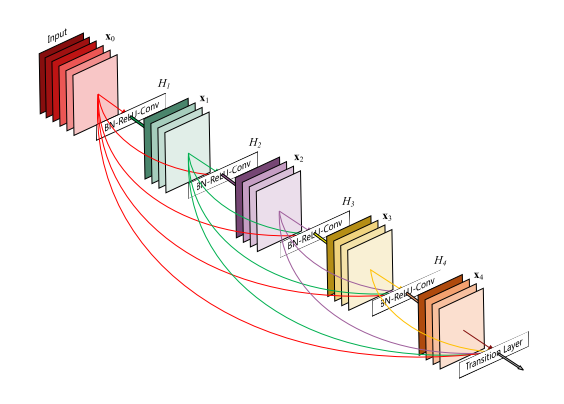

In [19]:
from tensorflow.keras.layers import AveragePooling2D

# Učitavanje pretreniranog modela bez poslednjih FC slojeva
dense_net = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Dodavanje FC slojeva
dense_net_output = dense_net.output
x = GlobalAveragePooling2D()(dense_net_output)
x = Dropout(0.5)(x)
last_layer = Dense(number_of_classes, activation='softmax')(x)

# Kreiranje modela i njegovo kompajliranje
with tf.device(device_name):
  model_densenet = Model(inputs=dense_net.input, outputs=last_layer)
  model_densenet.compile(loss='sparse_categorical_crossentropy',
                        optimizer=Adam(0.0001),
                        metrics=['accuracy'])


In [20]:

#Treniranje modela
with tf.device(device_name):
  history_densenet = model_densenet.fit(
      X_train_converted,
      y_train_converted,
      batch_size=10,
      epochs=40,
      validation_data=(X_val_converted, y_val_converted),
      shuffle=True,
      callbacks=[learning_rate_reduction]
  )


Epoch 1/40
30/30 [==============================] - 315s 9s/step - loss: 4.3767 - accuracy: 0.0473 - val_loss: 3.6348 - val_accuracy: 0.0667 - lr: 1.0000e-04
Epoch 2/40
30/30 [==============================] - 270s 9s/step - loss: 2.5086 - accuracy: 0.3074 - val_loss: 2.6713 - val_accuracy: 0.2800 - lr: 1.0000e-04
Epoch 3/40
30/30 [==============================] - 268s 9s/step - loss: 1.5399 - accuracy: 0.6419 - val_loss: 1.9907 - val_accuracy: 0.5067 - lr: 1.0000e-04
Epoch 4/40
30/30 [==============================] - 266s 9s/step - loss: 0.9523 - accuracy: 0.8176 - val_loss: 1.5345 - val_accuracy: 0.7600 - lr: 1.0000e-04
Epoch 5/40
30/30 [==============================] - 266s 9s/step - loss: 0.6199 - accuracy: 0.8986 - val_loss: 1.2830 - val_accuracy: 0.8267 - lr: 1.0000e-04
Epoch 6/40
30/30 [==============================] - 267s 9s/step - loss: 0.3671 - accuracy: 0.9764 - val_loss: 1.0422 - val_accuracy: 0.8533 - lr: 1.0000e-04
Epoch 7/40
30/30 [==============================] - 

In [30]:
# Evaluacija performansi modela
loss_test_densenet, acc_test_densenet = model_densenet.evaluate(X_test_converted, y_test_converted)
print("Validation Loss: ", loss_test_densenet)
print("Validation Accuracy: ", acc_test_densenet)



3/3 [==============================] - 13s 4s/step - loss: 0.5168 - accuracy: 0.8734
Validation Loss:  0.5168440341949463
Validation Accuracy:  0.8734177350997925


Kako bi se sacuvali podaci i po prekidanju konekcije sa runtime-om, uveden je ovaj deo koda.

In [18]:
test_loss_densenet = 0.3306
test_accuracy_densenet= 0.9067

val_loss_densenet = [3.6348, 2.6713, 1.9907, 1.5345, 1.2830, 1.0422, 0.9081, 0.8353, 0.7526, 0.7281,
                      0.6666, 0.6105, 0.5566, 0.5424, 0.5217, 0.4981, 0.4674, 0.4653, 0.4492, 0.4557,
                      0.4466, 0.4179, 0.4100, 0.3994, 0.3914, 0.3810, 0.3772, 0.3783, 0.3699, 0.3631,
                      0.3608, 0.3591, 0.3492, 0.3520, 0.3652, 0.3498, 0.3483, 0.3481, 0.3438, 0.3306]

val_accuracy_densenet = [0.0667, 0.2800, 0.5067, 0.7600, 0.8267, 0.8533, 0.8667, 0.8933, 0.8800, 0.8667,
                          0.8667, 0.8667, 0.8800, 0.8800, 0.8933, 0.8933, 0.8933, 0.8933, 0.8933, 0.8933,
                          0.8933, 0.8933, 0.8933, 0.9067, 0.9067, 0.9067, 0.9200, 0.9200, 0.9200, 0.9200,
                          0.9067, 0.8933, 0.9200, 0.9200, 0.9200, 0.9067, 0.8933, 0.8933, 0.9067, 0.9067]


train_loss_densenet = [4.3767, 2.5086, 1.5399, 0.9523, 0.6199, 0.3671, 0.2407, 0.2299, 0.1431, 0.1608,
                        0.1085, 0.0971, 0.1092, 0.0757, 0.0596, 0.0443, 0.0685, 0.0400, 0.0377, 0.0294,
                        0.0346, 0.0332, 0.0344, 0.0292, 0.0250, 0.0220, 0.0233, 0.0208, 0.0172, 0.0217,
                        0.0175, 0.0139, 0.0123, 0.0198, 0.0144, 0.0125, 0.0166, 0.0130, 0.0101, 0.0101]

train_accuracy_densenet = [0.0473, 0.3074, 0.6419, 0.8176, 0.8986, 0.9764, 0.9899, 0.9865, 0.9966, 0.9932,
                            1.0000, 1.0000, 0.9966, 1.0000, 1.0000, 1.0000, 0.9966, 1.0000, 1.0000, 1.0000,
                            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
                            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000]


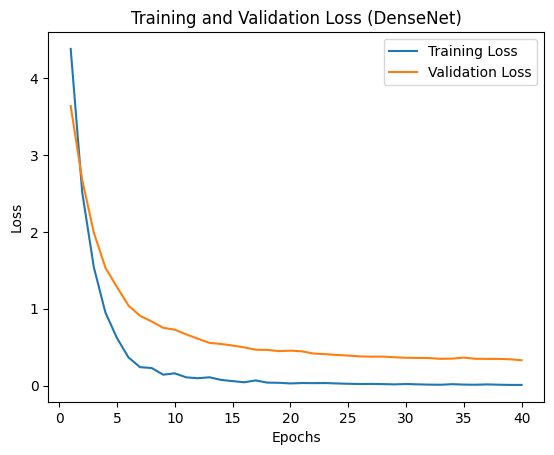

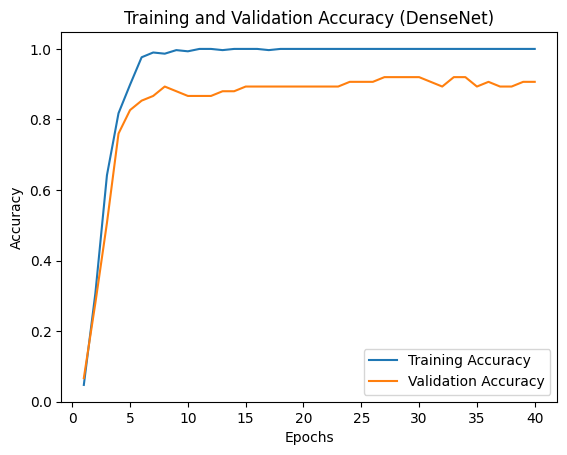

In [29]:
#Izvlačanje podataka za evaluaciju i poređenje sa drugim modelima
train_loss_densenet = history_densenet.history['loss']
train_accuracy_densenet = history_densenet.history['accuracy']
val_loss_densenet = history_densenet.history['val_loss']
val_accuracy_densenet = history_densenet.history['val_accuracy']


epochs_densenet = range(1, len(train_loss_densenet) + 1)

#Vizualizacija toka treninga i razlike perforamnsi validacije i treninga.
plt.plot(epochs_densenet, train_loss_densenet, label='Training Loss')
plt.plot(epochs_densenet, val_loss_densenet, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (DenseNet)')
plt.legend()
plt.show()

plt.plot(epochs_densenet, train_accuracy_densenet, label='Training Accuracy')
plt.plot(epochs_densenet, val_accuracy_densenet, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (DenseNet)')
plt.legend()
plt.show()


**Inception model**

Inception je naredni izbor za klasifikaciju lego slika zbog svoje arhitekture koja omogućava efikasno učenje i ekstrakciju značajnih i specifičnih osobina slika. Inception arhitektura koristi koncept "Inception modula" koji kombinuje različite veličine filtera unutar istog sloja, omogućavajući modelu da nauči različite nivoe apstrakcije. Na primer: moći će da uoči neku specifičnu ivicu nezavisno od njene veličine - bilo da ona zauzima malu ili veliku površinu slike. To omogućava bolje razumevanje različitih detalja slike, poput tekstura i oblika lego figura.

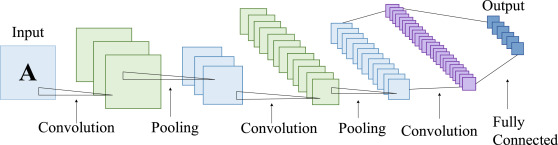

In [27]:

# Kada učitavamo model ignorišemo poslednji sloj, njega prilagođavamo našem setu podataka
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Dodavanje klasifikacionog sloja (sloja koji se sastoji od 38 neurona, svaki predstavlja jednu klasu. Gde zavrsi tok mreze, ta je klasa)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(38, activation='softmax')(x)  # 38 je broj klasa

# Kreiranje modela
model_inception = Model(inputs=base_model.input, outputs=predictions)

#Kreiranje optimizatora
initial_learning_rate = 0.0001 # pogodjeno
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

# Kompajliranje modela
model_inception.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])


87910968/87910968 [==============================] - 0s 0us/step


In [31]:

# Treniranje modela
history_inception = model_inception.fit(X_train_converted, y_train_converted, epochs=40, batch_size=64, validation_data=(X_val_converted, y_val_converted), callbacks=[learning_rate_reduction])


Epoch 1/40
5/5 [==============================] - 179s 36s/step - loss: 0.5273 - accuracy: 1.0000 - val_loss: 2.8288 - val_accuracy: 0.2400 - lr: 1.0000e-04
Epoch 2/40
5/5 [==============================] - 184s 37s/step - loss: 0.2490 - accuracy: 1.0000 - val_loss: 2.5832 - val_accuracy: 0.3067 - lr: 1.0000e-04
Epoch 3/40
5/5 [==============================] - 217s 42s/step - loss: 0.1096 - accuracy: 1.0000 - val_loss: 2.3619 - val_accuracy: 0.3600 - lr: 1.0000e-04
Epoch 4/40
5/5 [==============================] - 192s 37s/step - loss: 0.0532 - accuracy: 1.0000 - val_loss: 2.1924 - val_accuracy: 0.4000 - lr: 1.0000e-04
Epoch 5/40
5/5 [==============================] - 187s 38s/step - loss: 0.0322 - accuracy: 1.0000 - val_loss: 2.0610 - val_accuracy: 0.4667 - lr: 1.0000e-04
Epoch 6/40
5/5 [==============================] - 179s 35s/step - loss: 0.0230 - accuracy: 1.0000 - val_loss: 1.9624 - val_accuracy: 0.4933 - lr: 1.0000e-04
Epoch 7/40
5/5 [==============================] - 183s 36s

In [32]:
# Evaluacija performansi modela
loss_test_inception, acc_test_inception = model_inception.evaluate(X_test_converted, y_test_converted)
print("Validation Loss: ", loss_test_inception)
print("Validation Accuracy: ", acc_test_inception)


3/3 [==============================] - 10s 2s/step - loss: 1.3926 - accuracy: 0.7468
Validation Loss:  1.3925997018814087
Validation Accuracy:  0.746835470199585


In [17]:
test_loss_inception = 1.2388
test_accuracy_inception = 0.7200



val_loss_inception = [2.8288, 2.5832, 2.3619, 2.1924, 2.0610, 1.9624, 1.8862, 1.8230, 1.7699, 1.7282,
                      1.6874, 1.6544, 1.6269, 1.6026, 1.5773, 1.5553, 1.5325, 1.5116, 1.4950, 1.4811,
                      1.4692, 1.4598, 1.4517, 1.4435, 1.4354, 1.4262, 1.4207, 1.4154, 1.4091, 1.4046,
                      1.4009, 1.3980, 1.3951, 1.3916, 1.3878, 1.3824, 1.3777, 1.3740, 1.3700, 1.3651]

val_accuracy_inception = [0.2400, 0.3067, 0.3600, 0.4000, 0.4667, 0.4933, 0.5333, 0.5333, 0.5333, 0.5333,
                          0.5333, 0.5733, 0.5600, 0.5600, 0.5733, 0.5867, 0.6000, 0.6133, 0.6133, 0.6133,
                          0.6533, 0.6400, 0.6533, 0.6667, 0.6667, 0.6933, 0.6933, 0.7067, 0.7067, 0.7067,
                          0.6933, 0.6933, 0.7067, 0.7067, 0.7067, 0.7067, 0.7067, 0.7067, 0.7067, 0.7067]



train_loss_inception = [3.6645, 2.2295, 1.3006, 0.6596, 0.2957, 0.1315, 0.0639, 0.0391, 0.0243, 0.0188,
                        0.0133, 0.0117, 0.0098, 0.0083, 0.0075, 0.0069, 0.0064, 0.0061, 0.0060, 0.0054,
                        0.0049, 0.0047, 0.0042, 0.0040, 0.0037, 0.0039, 0.0042, 0.0038, 0.0033, 0.0030,
                        0.0030, 0.0032, 0.0026, 0.0025, 0.0028, 0.0029, 0.0024, 0.0023, 0.0022, 0.0021]

train_accuracy_inception = [0.0574, 0.8176, 0.9932, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
                            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
                            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
                            1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
                            1.0000, 1.0000]


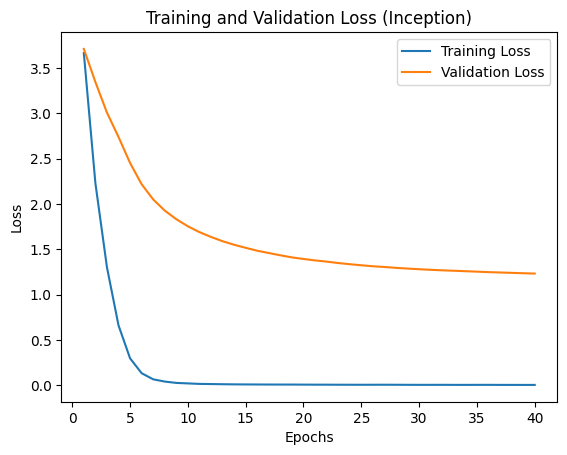

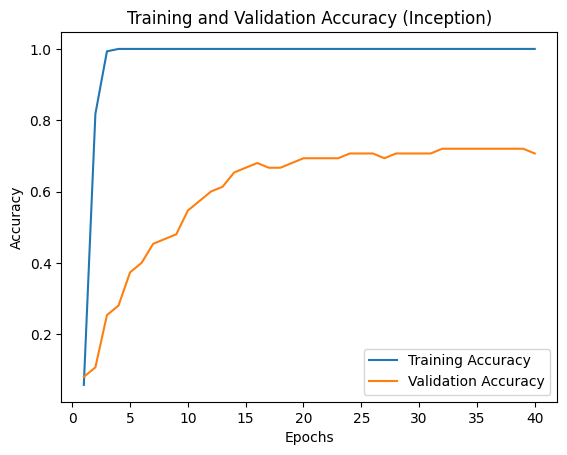

In [23]:
import matplotlib.pyplot as plt




# Prikupljanje podataka za evaluaciju treninga i performansi
#train_loss_inception = history_inception.history['loss']
#train_accuracy_inception = history_inception.history['accuracy']
#val_loss_inception = history_inception.history['val_loss']
#val_accuracy_inception = history_inception.history['val_accuracy']


# Plotovanje toka treninga
epochs_inception = range(1, len(train_loss_inception) + 1)

plt.plot(epochs_inception, train_loss_inception, label='Training Loss')
plt.plot(epochs_inception, val_loss_inception, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss (Inception)')
plt.legend()
plt.show()

plt.plot(epochs_inception, train_accuracy_inception, label='Training Accuracy')
plt.plot(epochs_inception, val_accuracy_inception, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy (Inception)')
plt.legend()
plt.show()


**VGG Model**

Iako dosta star, ovo je model koji je posenbo pogodan za  prepoznavanje geometrijskih oblika. Kako lego kocke imaju dosta specifične geometrijske oblike tj svaka figura ima sebi svojstven oblik, odlučeno je da se isproba i ovaj model. Specifičnosti ove arhitekture su veliki broj konvulativnih slojeva sa specifičnim filterima, prilagođenim za prepoznavanje geometrijskih celina.

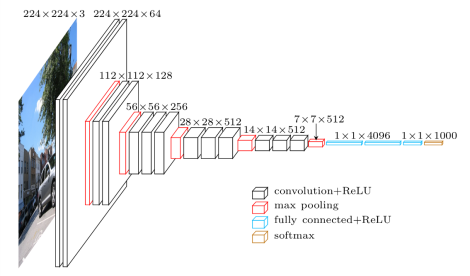

In [17]:


base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Učitavanje pretreniranog modela. Kako  output ovog modela nije normalizovan, uradjena je normalizacija i pooling.
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)

# Dodate su tehnike regularizacije
x = Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.0001))(x)
x = Dropout(0.7)(x)

# Add the final Dense layer for classification
number_of_classes = len(data_df['class_id'].unique())
predictions = Dense(number_of_classes, activation='softmax')(x)

model_vgg = Model(inputs=base_model.input, outputs=predictions)


# Kreiranje optimizatora.

initial_learning_rate = 0.0001  # Set your desired initial learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=initial_learning_rate)

model_vgg.compile(optimizer=Adam(learning_rate=initial_learning_rate),loss='sparse_categorical_crossentropy',metrics=['accuracy'])



# Treniranje modela
history_vgg = model_vgg.fit(X_train_converted, y_train_converted, epochs=40, batch_size=32, validation_data=(X_val_converted, y_val_converted))

# Evaluacija modela
loss_test_vgg, acc_test_vgg = model_vgg.evaluate(X_val_converted, y_val_converted)
print("Validation Loss: ", loss_test_vgg)
print("Validation Accuracy: ", acc_test_vgg)



58889256/58889256 [==============================] - 0s 0us/step
Epoch 1/40
10/10 [==============================] - 667s 67s/step - loss: 4.0147 - accuracy: 0.0405 - val_loss: 3.7502 - val_accuracy: 0.0133
Epoch 2/40
10/10 [==============================] - 618s 62s/step - loss: 3.6906 - accuracy: 0.0439 - val_loss: 4.5177 - val_accuracy: 0.0267
Epoch 3/40
10/10 [==============================] - 620s 62s/step - loss: 3.6510 - accuracy: 0.0372 - val_loss: 6.0094 - val_accuracy: 0.0267
Epoch 4/40
10/10 [==============================] - 618s 62s/step - loss: 3.6368 - accuracy: 0.0473 - val_loss: 6.7772 - val_accuracy: 0.0133
Epoch 5/40
10/10 [==============================] - 617s 62s/step - loss: 3.6841 - accuracy: 0.0507 - val_loss: 6.5981 - val_accuracy: 0.0133
Epoch 6/40
10/10 [==============================] - 657s 66s/step - loss: 3.6735 - accuracy: 0.0473 - val_loss: 5.8250 - val_accuracy: 0.0267
Epoch 7/40
10/10 [==============================] - 661s 67s/step - loss: 3.6438 - 

Ovde su iz loga izolovane vrednosti, jer je izgubljen pristup ovom objektu.

In [19]:
val_loss_vgg = [3.7502, 4.5177, 6.0094, 6.7772, 6.5981, 5.8250, 8.3086, 16.9898, 9.3463, 8.2992,
                6.4311, 5.8551, 6.4655, 6.2439, 5.2592, 10.3913, 7.2465, 9.9294, 17.6996, 14.3251,
                8.8977, 8.9079, 6.7995, 6.3824, 8.1331, 6.2766, 5.6922, 4.6263, 4.7565, 4.2448,
                4.0176, 4.5571, 7.8764, 5.6475, 4.4011, 4.1049, 3.8995, 4.5633, 3.7793, 4.3477]

val_accuracy_vgg = [0.0133, 0.0267, 0.0267, 0.0133, 0.0133, 0.0267, 0.0400, 0.0133, 0.0133, 0.0133,
                    0.0400, 0.0533, 0.0133, 0.0133, 0.0133, 0.0133, 0.0133, 0.0267, 0.0267, 0.0267,
                    0.0400, 0.0533, 0.0133, 0.0133, 0.0533, 0.0133, 0.0133, 0.0133, 0.0400, 0.0400,
                    0.0267, 0.0400, 0.0267, 0.0667, 0.0133, 0.0133, 0.0400, 0.0400, 0.0533, 0.0400]

test_loss_vgg = 4.3477
test_accuracy_vgg = 0.0400

train_loss_vgg = [4.0147, 3.6906, 3.6510, 3.6368, 3.6841, 3.6735, 3.6438, 3.6334, 3.6504, 3.5945,
                  3.6165, 3.5956, 3.5868, 3.5370, 3.5119, 3.5214, 3.5573, 3.5180, 3.5476, 3.5563,
                  3.5298, 3.5028, 3.4676, 3.4251, 3.4483, 3.3558, 3.3781, 3.3452, 3.3234, 3.3019,
                  3.2742, 3.2274, 3.2753, 3.3066, 3.2345, 3.2042, 3.1238, 3.2088, 3.1939, 3.1141]

train_accuracy_vgg = [0.0405, 0.0439, 0.0372, 0.0473, 0.0507, 0.0473, 0.0405, 0.0507, 0.0507, 0.0608,
                      0.0372, 0.0574, 0.0676, 0.0811, 0.0777, 0.0980, 0.0574, 0.0946, 0.0507, 0.0743,
                      0.0878, 0.0608, 0.0912, 0.0946, 0.0845, 0.0912, 0.0980, 0.1081, 0.0912, 0.1216,
                      0.1284, 0.1351, 0.1622, 0.1318, 0.1182, 0.1182, 0.1216, 0.1216, 0.1655]




range(1, 41)


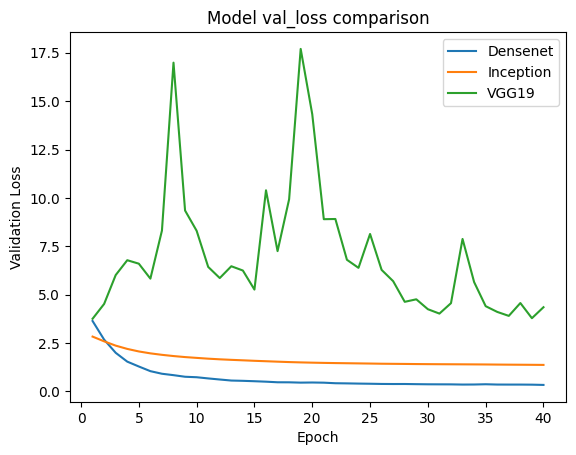

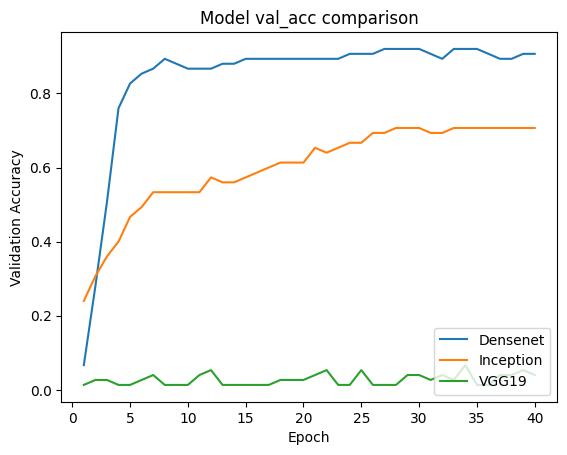

In [20]:
# Poređenje toka treninga modela.

plt.plot(epochs,val_loss_densenet)
plt.plot( range(1, len(val_loss_inception) + 1), val_loss_inception)
plt.plot(range(1, len(val_loss_vgg) + 1), val_loss_vgg)


plt.title('Model val_loss comparison')
plt.ylabel('Validation Loss')
plt.xlabel('Epoch')
plt.legend(['Densenet', 'Inception',  'VGG19'], loc='upper right')
plt.show()

plt.plot( range(1, len(val_accuracy_densenet) + 1),val_accuracy_densenet)
plt.plot( range(1, len(val_accuracy_inception) + 1),val_accuracy_inception)
plt.plot(range(1, len(val_accuracy_vgg) + 1), val_accuracy_vgg)



plt.title('Model val_acc comparison')
plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.legend(['Densenet', 'Inception', 'VGG19'], loc='lower right')
plt.show()


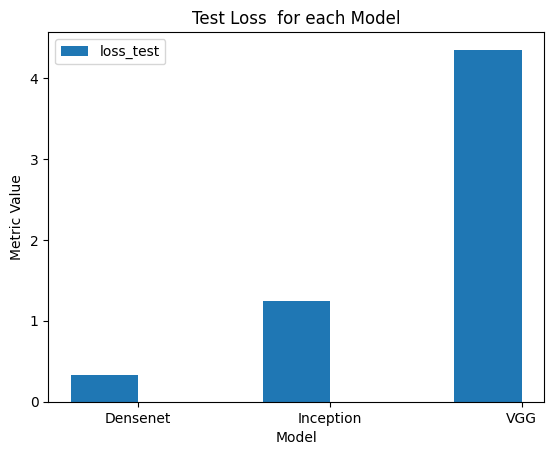

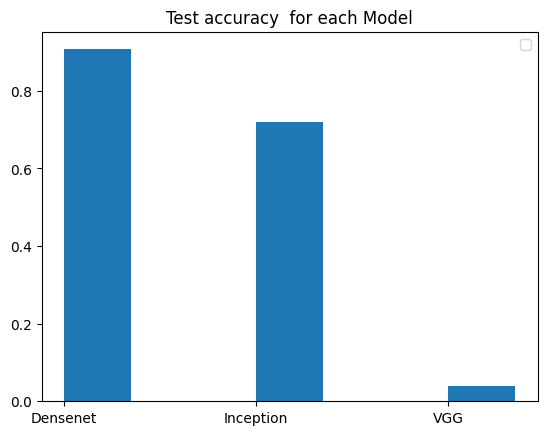

In [27]:
#Evaluacija finalnih performansi.

model_names = ['Densenet', 'Inception', 'VGG']


loss_test = [test_loss_densenet, test_loss_inception,  test_loss_vgg]
acc_test = [test_accuracy_densenet, test_accuracy_inception, test_accuracy_vgg]


bar_width = 0.35

#
x_pos = np.arange(len(model_names))


plt.bar(x_pos, loss_test, width=bar_width, label='loss_test')


plt.xlabel('Model')
plt.ylabel('Metric Value')
plt.title('Test Loss  for each Model')
plt.xticks(x_pos + bar_width / 2, model_names)
plt.legend()


plt.show()
x_pos = np.arange(len(model_names))
plt.xticks(x_pos + bar_width / 2, model_names)
plt.legend()
plt.title('Test accuracy  for each Model')
plt.bar(x_pos + bar_width, acc_test, width=bar_width, label='acc_test')
plt.show()

In [22]:
#Pravljenje predikcija
y_pred = best_model.predict(X_test_converted)
y_pred_classes = np.argmax(y_pred, axis=1)

#Evaluacija najboljeg modela sa dodatnim metrikama.
accuracy = np.mean(y_pred_classes == y_test_converted)


true_positives = np.sum(np.logical_and(y_pred_classes == 1, y_test_converted == 1))
false_positives = np.sum(np.logical_and(y_pred_classes == 1, y_test_converted == 0))
false_negatives = np.sum(np.logical_and(y_pred_classes == 0, y_test_converted == 1))

precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)
f1_score = 2 * (precision * recall) / (precision + recall)


print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1_score)

3/3 [==============================] - 32s 7s/step
Accuracy: 0.8734177215189873
Precision: 1.0
Recall: 1.0
F1-Score: 1.0


1/1 [==============================] - 0s 182ms/step
UTVRDJENA KLASA: 32 Minifigure: JANNAH


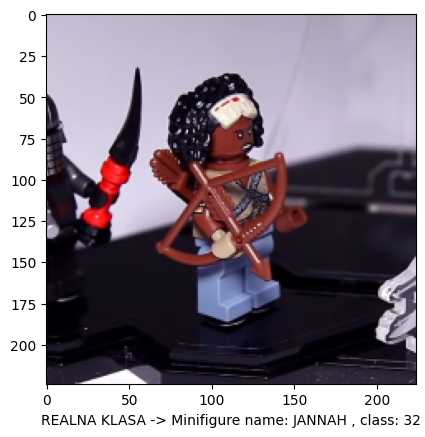

1/1 [==============================] - 0s 186ms/step
UTVRDJENA KLASA: 32 Minifigure: JANNAH


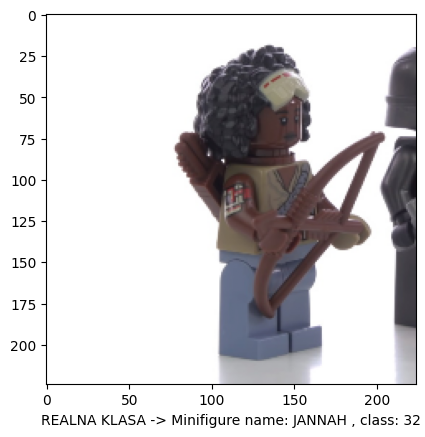

1/1 [==============================] - 0s 194ms/step
UTVRDJENA KLASA: 32 Minifigure: JANNAH


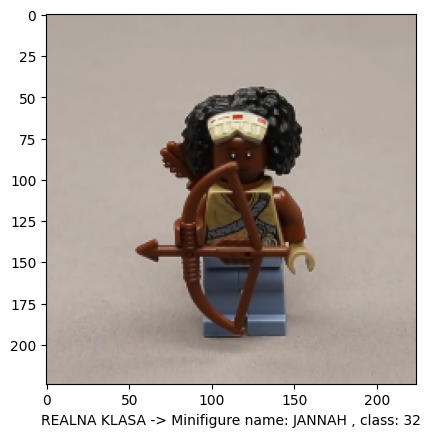

1/1 [==============================] - 0s 175ms/step
UTVRDJENA KLASA: 32 Minifigure: JANNAH


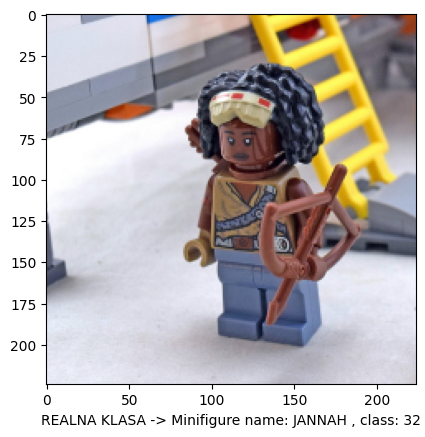

1/1 [==============================] - 0s 180ms/step
UTVRDJENA KLASA: 1 Minifigure: SPIDER-MAN


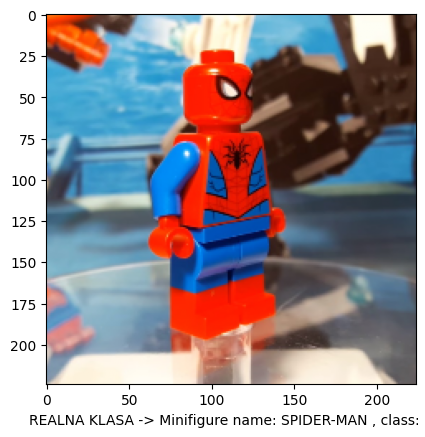

1/1 [==============================] - 0s 196ms/step
UTVRDJENA KLASA: 26 Minifigure: OWEN GRADY


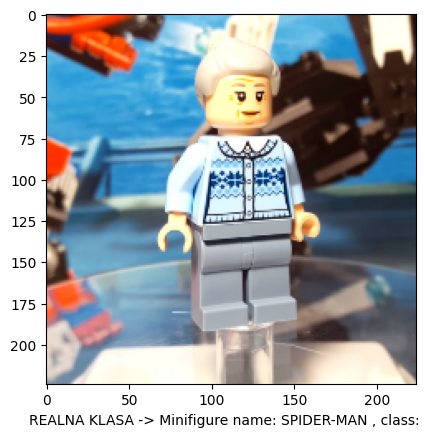

1/1 [==============================] - 0s 177ms/step
UTVRDJENA KLASA: 2 Minifigure: VENOM


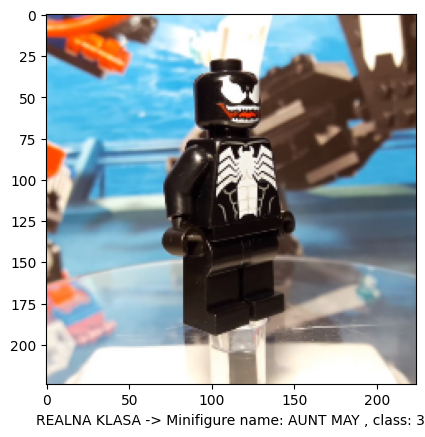

1/1 [==============================] - 0s 180ms/step
UTVRDJENA KLASA: 4 Minifigure: GHOST SPIDER


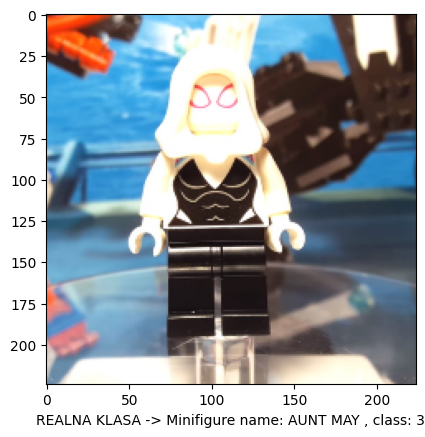

1/1 [==============================] - 0s 186ms/step
UTVRDJENA KLASA: 1 Minifigure: SPIDER-MAN


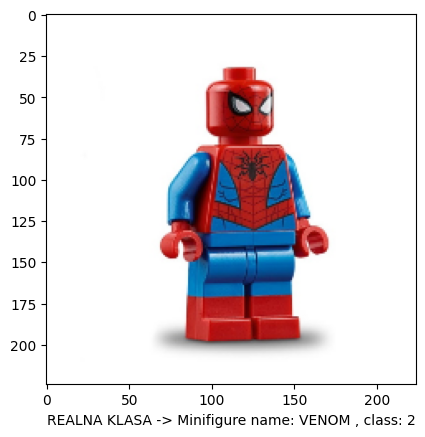

1/1 [==============================] - 0s 219ms/step
UTVRDJENA KLASA: 3 Minifigure: AUNT MAY


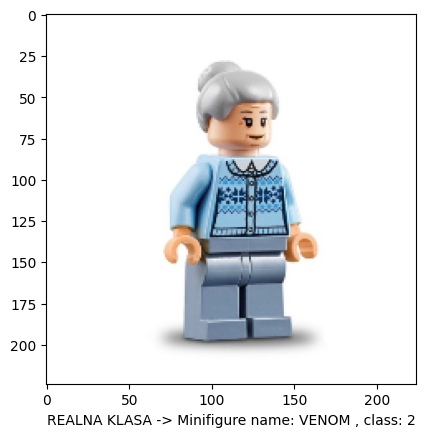

1/1 [==============================] - 0s 313ms/step
UTVRDJENA KLASA: 4 Minifigure: GHOST SPIDER


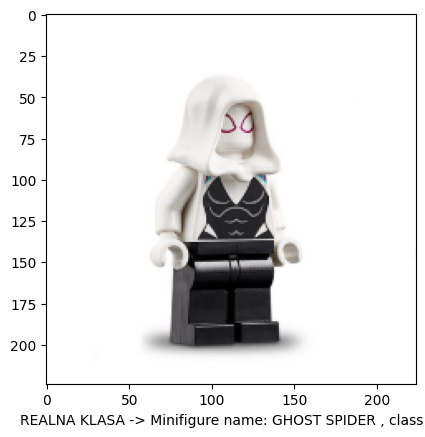

1/1 [==============================] - 0s 319ms/step
UTVRDJENA KLASA: 17 Minifigure: SPIDER-MAN


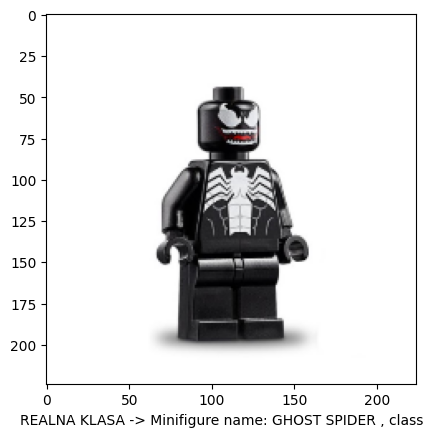

1/1 [==============================] - 0s 303ms/step
UTVRDJENA KLASA: 5 Minifigure: YODA


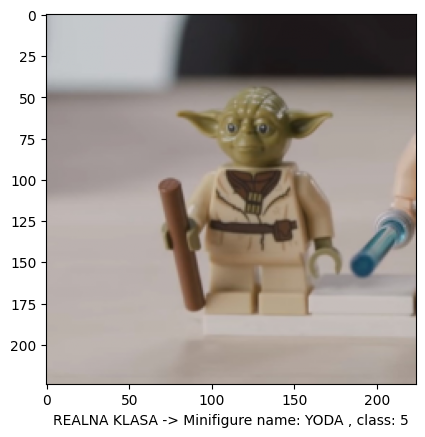

1/1 [==============================] - 0s 333ms/step
UTVRDJENA KLASA: 6 Minifigure: LUKE SKYWALKER


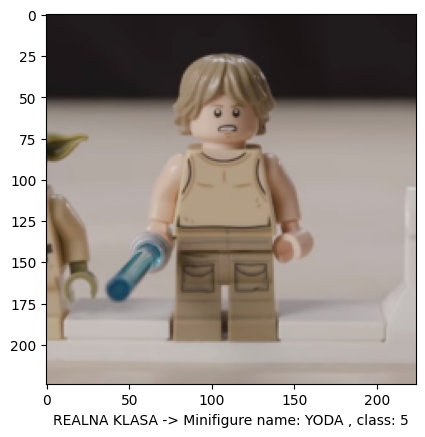

1/1 [==============================] - 0s 321ms/step
UTVRDJENA KLASA: 7 Minifigure: R2-D2


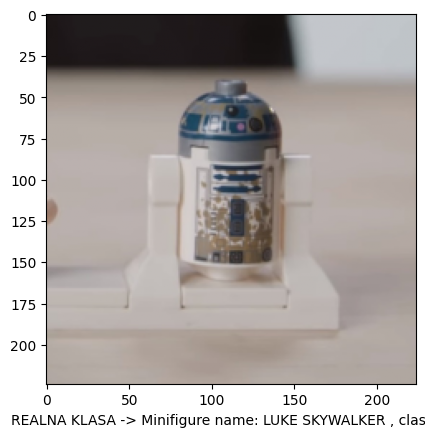

1/1 [==============================] - 0s 280ms/step
UTVRDJENA KLASA: 5 Minifigure: YODA


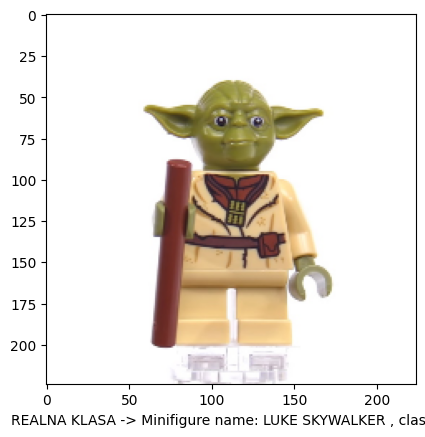

1/1 [==============================] - 0s 206ms/step
UTVRDJENA KLASA: 6 Minifigure: LUKE SKYWALKER


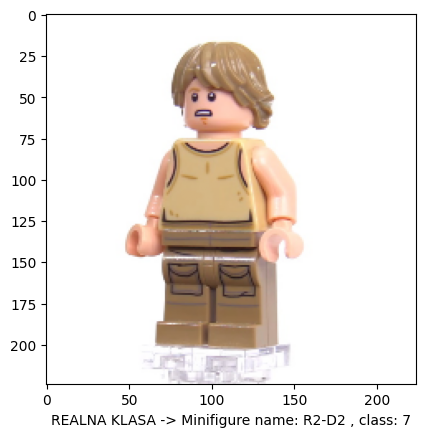

1/1 [==============================] - 0s 180ms/step
UTVRDJENA KLASA: 7 Minifigure: R2-D2


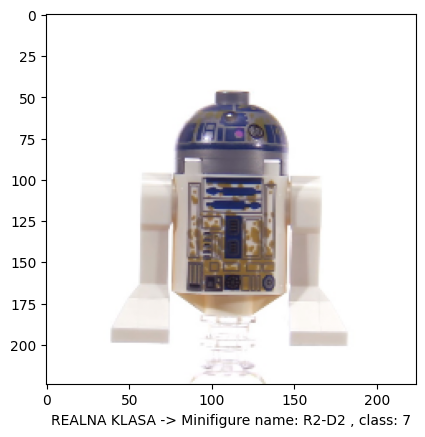

1/1 [==============================] - 0s 181ms/step
UTVRDJENA KLASA: 18 Minifigure: HARRY POTTER


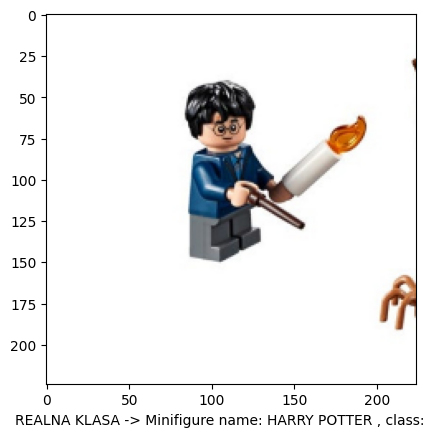

1/1 [==============================] - 0s 181ms/step
UTVRDJENA KLASA: 18 Minifigure: HARRY POTTER


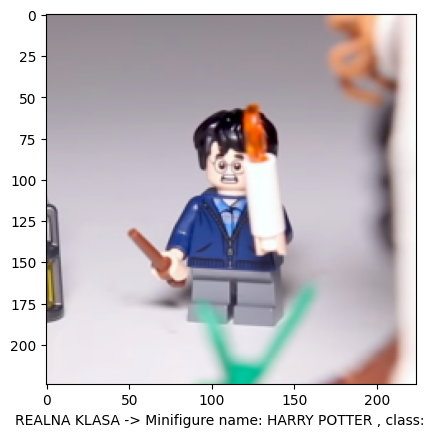

1/1 [==============================] - 0s 177ms/step
UTVRDJENA KLASA: 19 Minifigure: RON WEASLEY


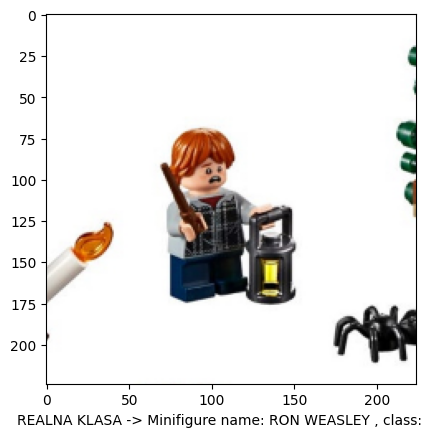

1/1 [==============================] - 0s 177ms/step
UTVRDJENA KLASA: 19 Minifigure: RON WEASLEY


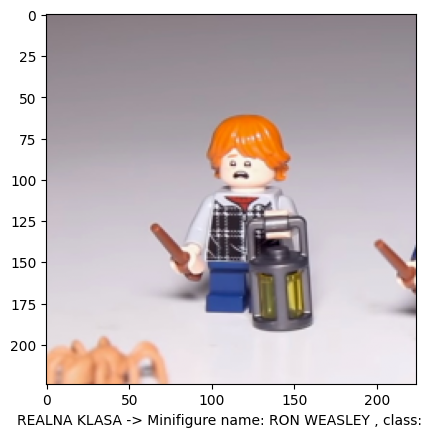

1/1 [==============================] - 0s 200ms/step
UTVRDJENA KLASA: 26 Minifigure: OWEN GRADY


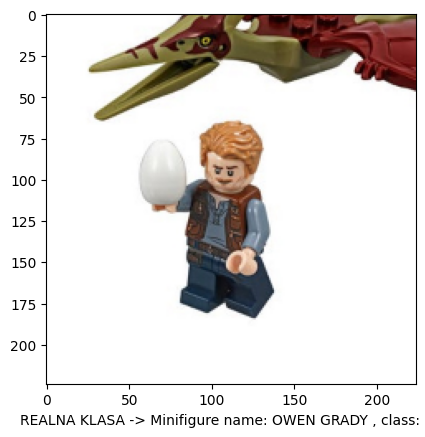

1/1 [==============================] - 0s 188ms/step
UTVRDJENA KLASA: 26 Minifigure: OWEN GRADY


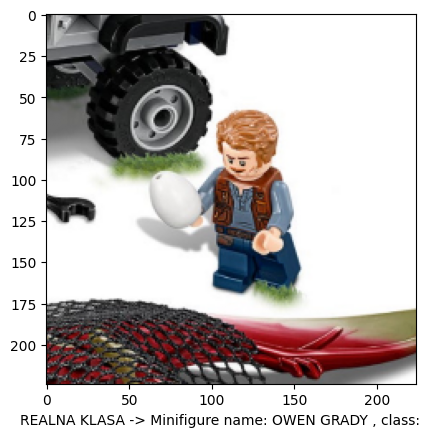

1/1 [==============================] - 0s 203ms/step
UTVRDJENA KLASA: 3 Minifigure: AUNT MAY


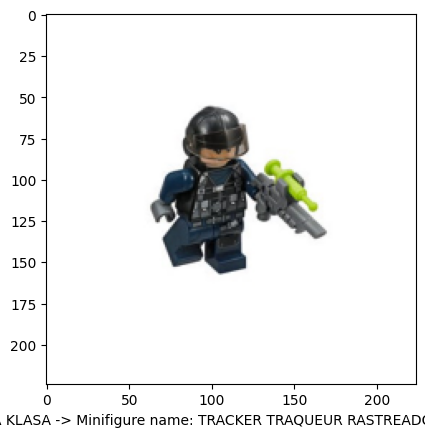

1/1 [==============================] - 0s 177ms/step
UTVRDJENA KLASA: 27 Minifigure: TRACKER TRAQUEUR RASTREADOR


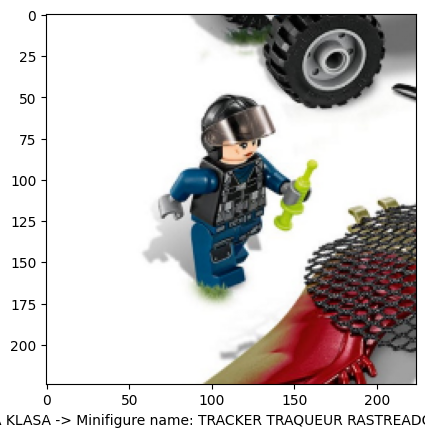

1/1 [==============================] - 0s 193ms/step
UTVRDJENA KLASA: 15 Minifigure: MYSTERIO


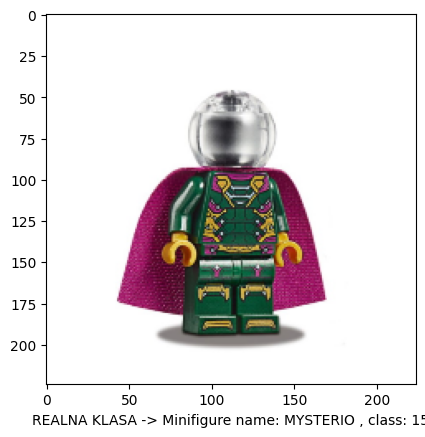

1/1 [==============================] - 0s 186ms/step
UTVRDJENA KLASA: 16 Minifigure: FIREFIGHTER


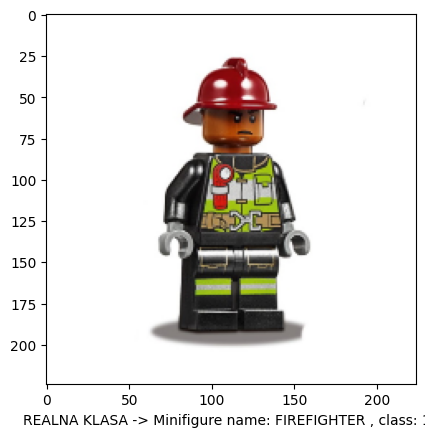

1/1 [==============================] - 0s 197ms/step
UTVRDJENA KLASA: 17 Minifigure: SPIDER-MAN


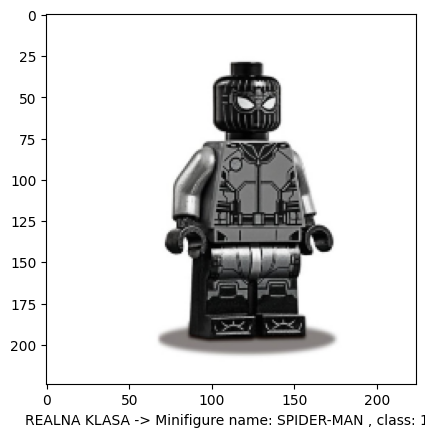

1/1 [==============================] - 0s 420ms/step
UTVRDJENA KLASA: 14 Minifigure: KLATOOINIAN RAIDER 2


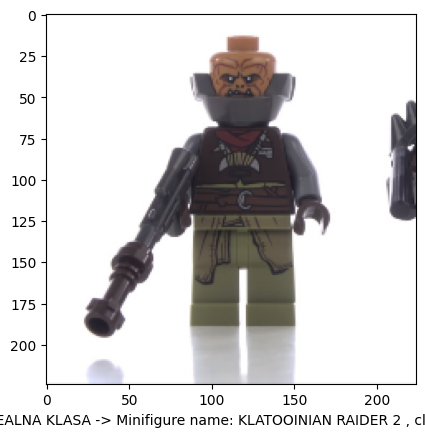

1/1 [==============================] - 0s 309ms/step
UTVRDJENA KLASA: 20 Minifigure: BLACK WIDOW


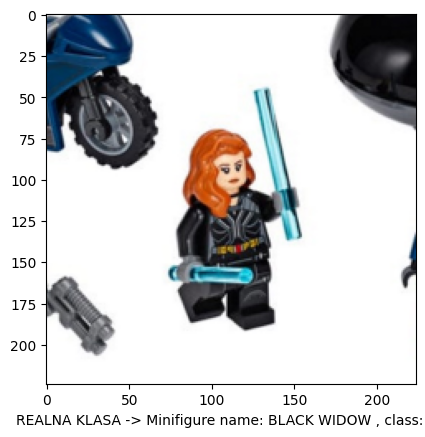

1/1 [==============================] - 0s 309ms/step
UTVRDJENA KLASA: 10 Minifigure: KYLO REN


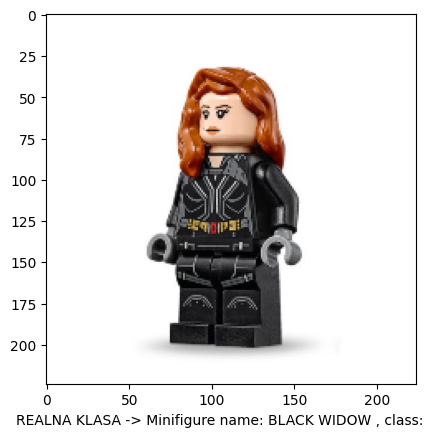

1/1 [==============================] - 0s 332ms/step
UTVRDJENA KLASA: 20 Minifigure: BLACK WIDOW


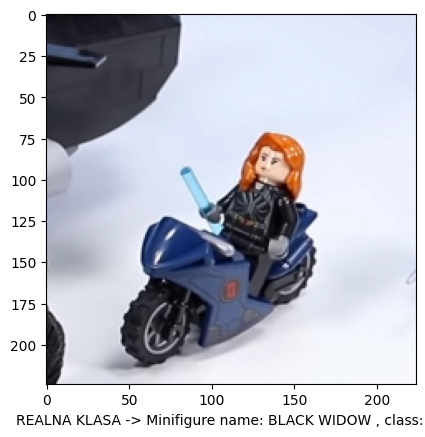

1/1 [==============================] - 0s 312ms/step
UTVRDJENA KLASA: 21 Minifigure: YELENA BELOVA


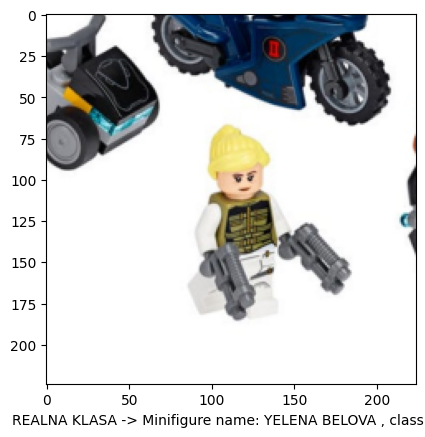

1/1 [==============================] - 0s 335ms/step
UTVRDJENA KLASA: 21 Minifigure: YELENA BELOVA


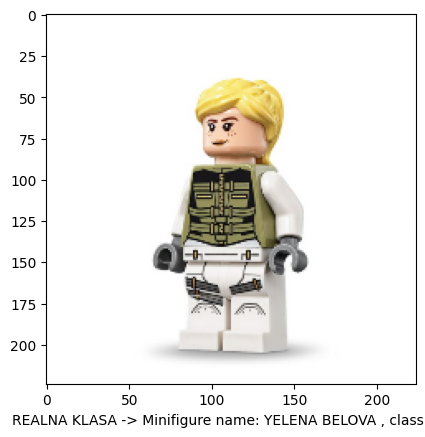

1/1 [==============================] - 0s 350ms/step
UTVRDJENA KLASA: 20 Minifigure: BLACK WIDOW


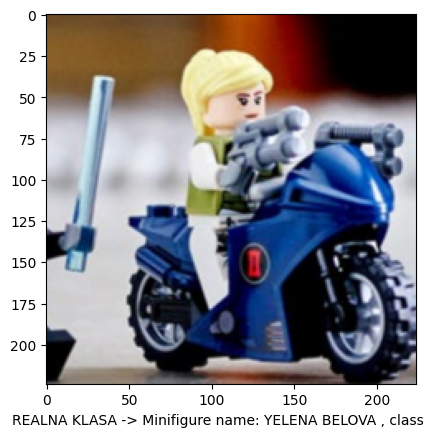

1/1 [==============================] - 0s 195ms/step
UTVRDJENA KLASA: 22 Minifigure: TASKMASTER


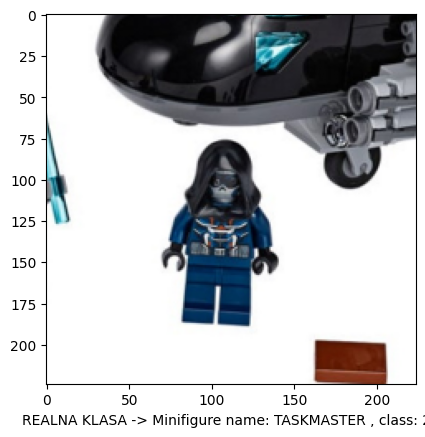

1/1 [==============================] - 0s 219ms/step
UTVRDJENA KLASA: 22 Minifigure: TASKMASTER


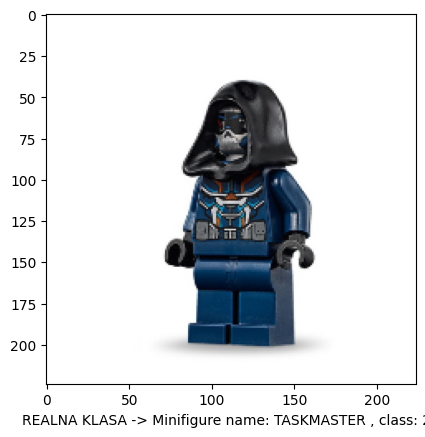

1/1 [==============================] - 0s 177ms/step
UTVRDJENA KLASA: 22 Minifigure: TASKMASTER


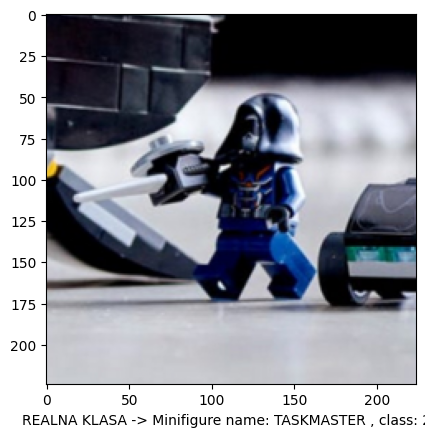

1/1 [==============================] - 0s 183ms/step
UTVRDJENA KLASA: 23 Minifigure: CAPTAIN AMERICA


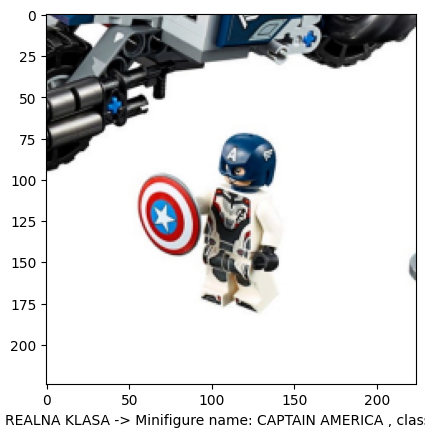

1/1 [==============================] - 0s 211ms/step
UTVRDJENA KLASA: 23 Minifigure: CAPTAIN AMERICA


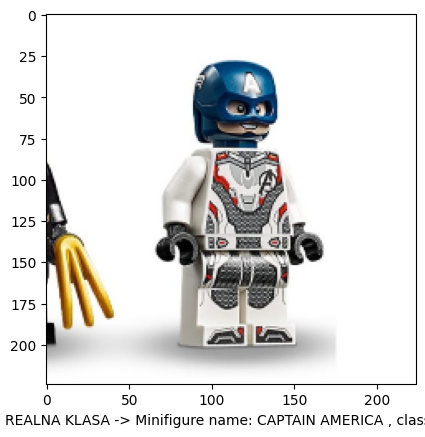

1/1 [==============================] - 0s 193ms/step
UTVRDJENA KLASA: 24 Minifigure: OUTRIDER 1


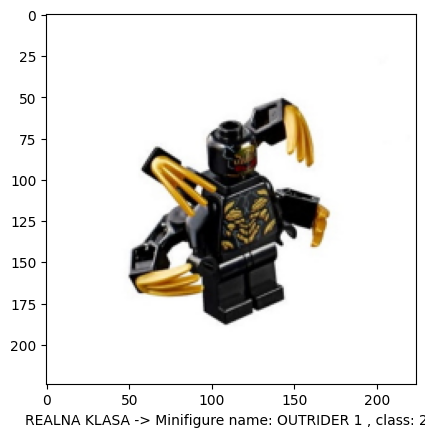

1/1 [==============================] - 0s 183ms/step
UTVRDJENA KLASA: 24 Minifigure: OUTRIDER 1


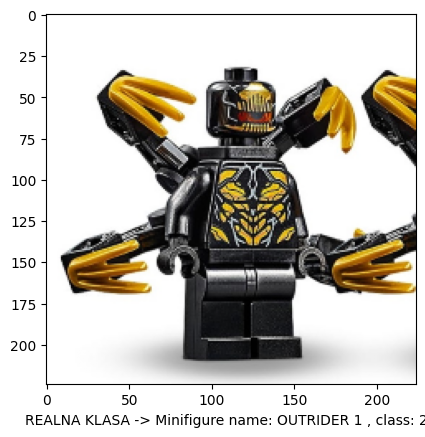

1/1 [==============================] - 0s 233ms/step
UTVRDJENA KLASA: 25 Minifigure: OUTRIDER 2


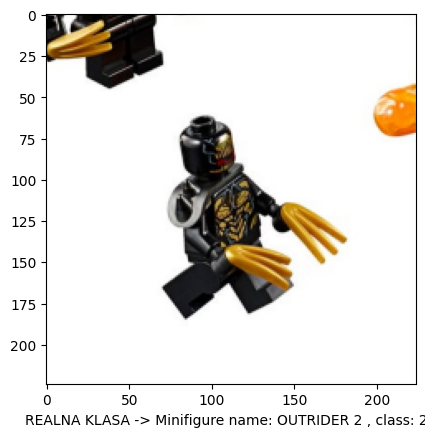

1/1 [==============================] - 0s 186ms/step
UTVRDJENA KLASA: 25 Minifigure: OUTRIDER 2


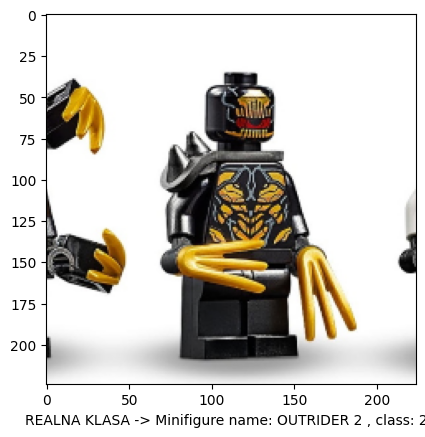

1/1 [==============================] - 0s 222ms/step
UTVRDJENA KLASA: 31 Minifigure: IRON MAN MK 50


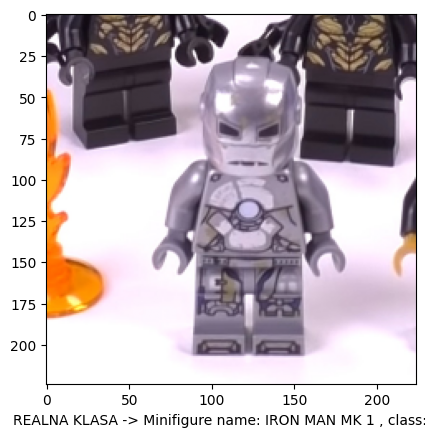

1/1 [==============================] - 0s 219ms/step
UTVRDJENA KLASA: 28 Minifigure: IRON MAN MK 1


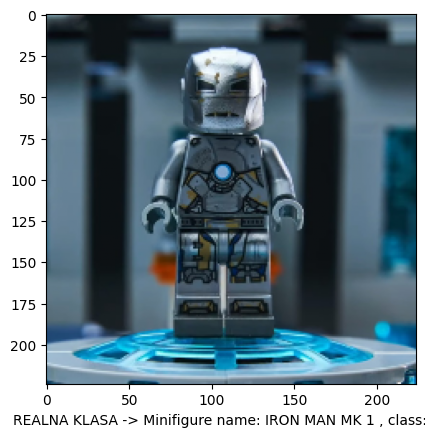

1/1 [==============================] - 0s 195ms/step
UTVRDJENA KLASA: 29 Minifigure: IRON MAN MK 5


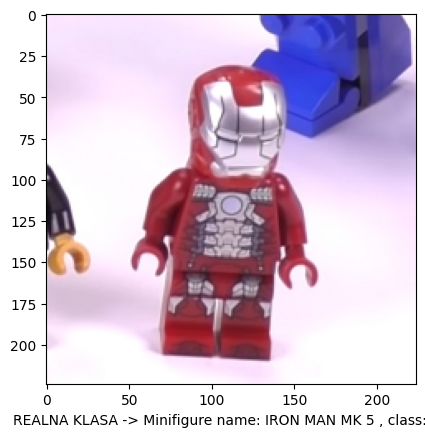

1/1 [==============================] - 0s 185ms/step
UTVRDJENA KLASA: 29 Minifigure: IRON MAN MK 5


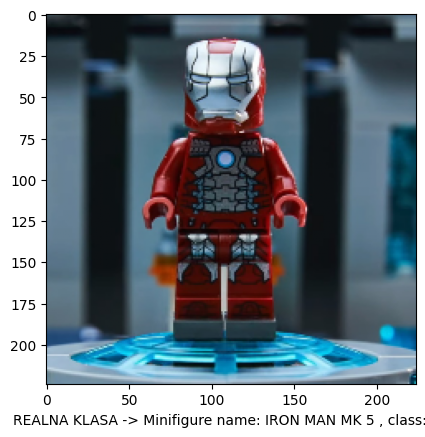

1/1 [==============================] - 0s 243ms/step
UTVRDJENA KLASA: 30 Minifigure: IRON MAN MK 41


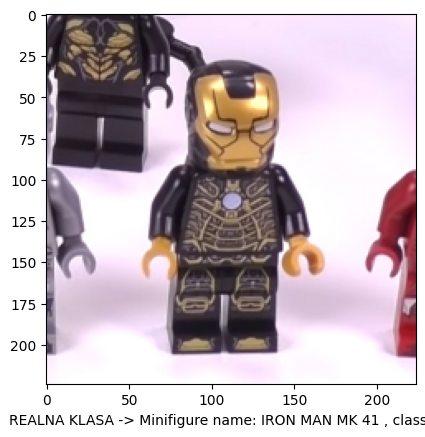

1/1 [==============================] - 0s 340ms/step
UTVRDJENA KLASA: 30 Minifigure: IRON MAN MK 41


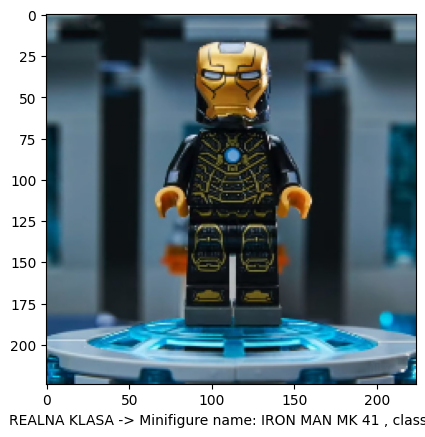

1/1 [==============================] - 0s 355ms/step
UTVRDJENA KLASA: 31 Minifigure: IRON MAN MK 50


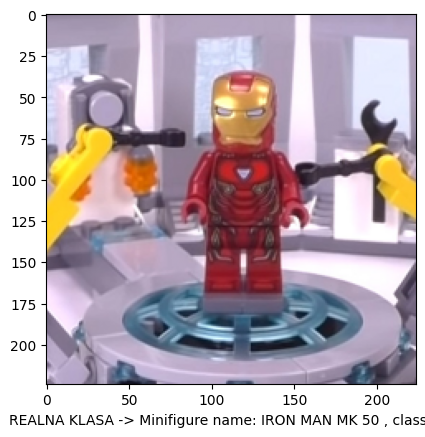

1/1 [==============================] - 1s 616ms/step
UTVRDJENA KLASA: 31 Minifigure: IRON MAN MK 50


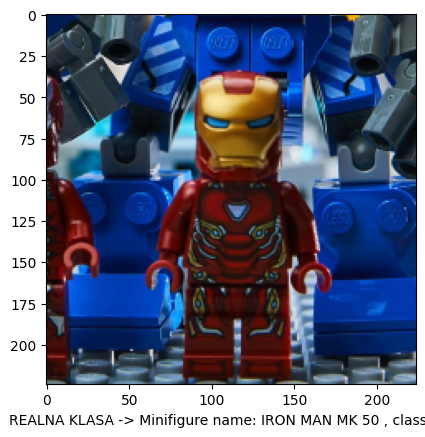

1/1 [==============================] - 0s 351ms/step
UTVRDJENA KLASA: 8 Minifigure: MACE WINDU


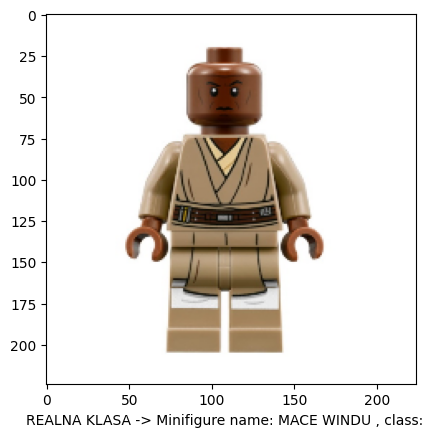

1/1 [==============================] - 0s 328ms/step
UTVRDJENA KLASA: 8 Minifigure: MACE WINDU


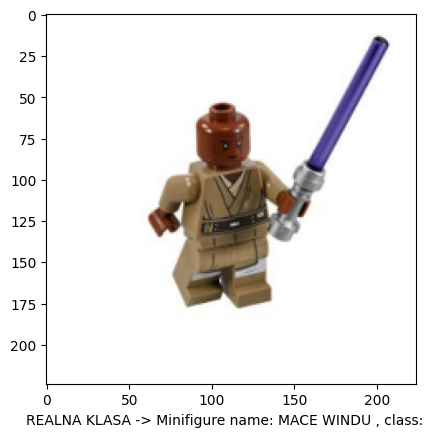

1/1 [==============================] - 0s 306ms/step
UTVRDJENA KLASA: 9 Minifigure: GENERAL GRIEVOUS


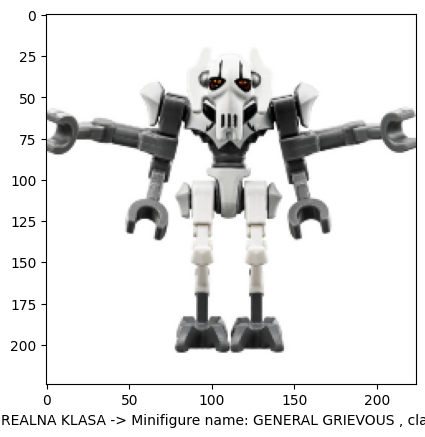

1/1 [==============================] - 0s 359ms/step
UTVRDJENA KLASA: 9 Minifigure: GENERAL GRIEVOUS


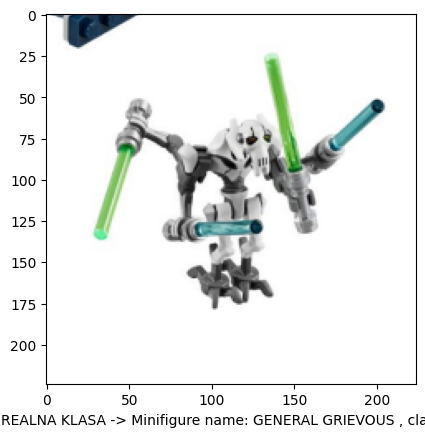

1/1 [==============================] - 0s 322ms/step
UTVRDJENA KLASA: 10 Minifigure: KYLO REN


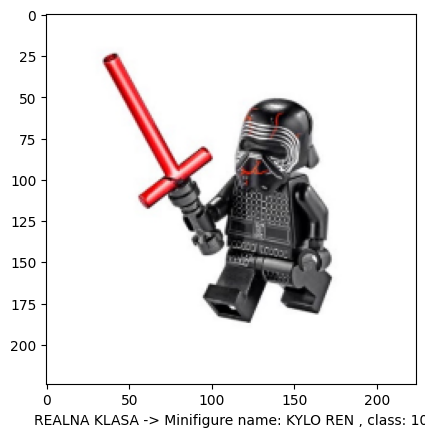

1/1 [==============================] - 0s 362ms/step
UTVRDJENA KLASA: 10 Minifigure: KYLO REN


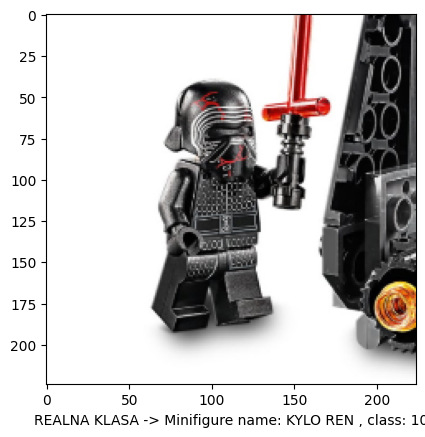

1/1 [==============================] - 0s 386ms/step
UTVRDJENA KLASA: 11 Minifigure: THE MANDALORIAN


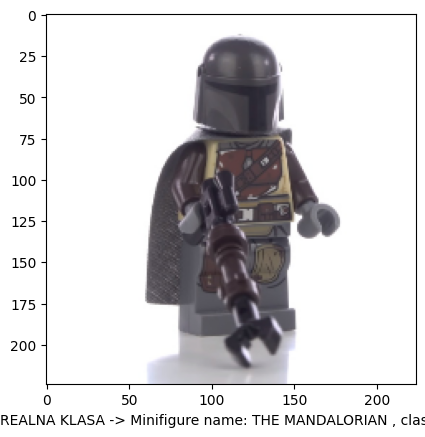

1/1 [==============================] - 0s 349ms/step
UTVRDJENA KLASA: 12 Minifigure: CARA DUNE


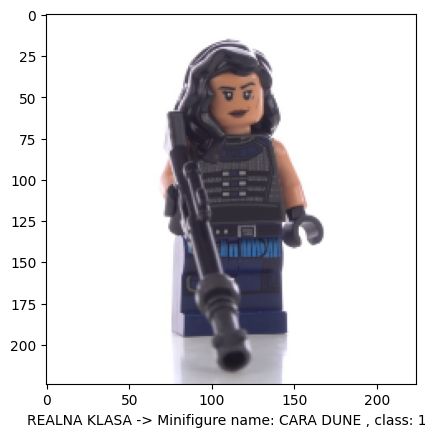

1/1 [==============================] - 0s 311ms/step
UTVRDJENA KLASA: 13 Minifigure: KLATOOINIAN RAIDER 1


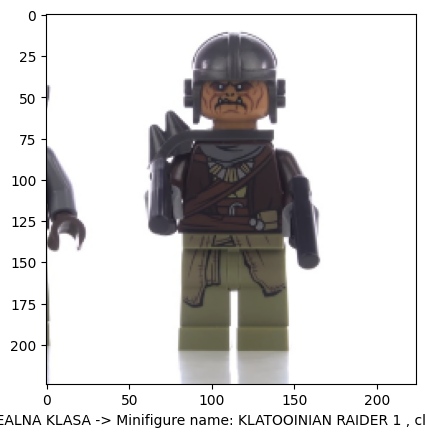

1/1 [==============================] - 0s 312ms/step
UTVRDJENA KLASA: 34 Minifigure: DARTH VADER


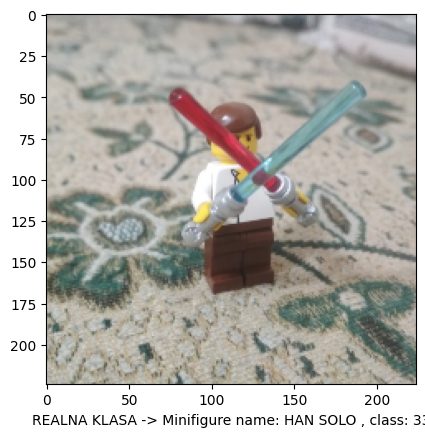

1/1 [==============================] - 0s 297ms/step
UTVRDJENA KLASA: 33 Minifigure: HAN SOLO


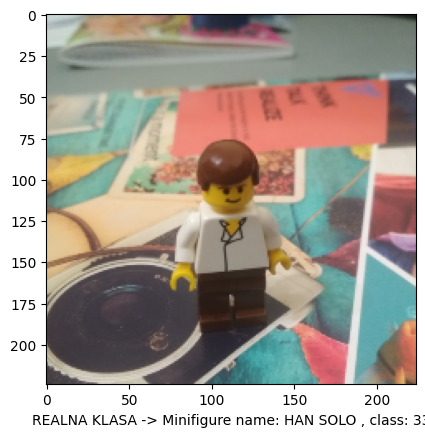

1/1 [==============================] - 0s 310ms/step
UTVRDJENA KLASA: 34 Minifigure: DARTH VADER


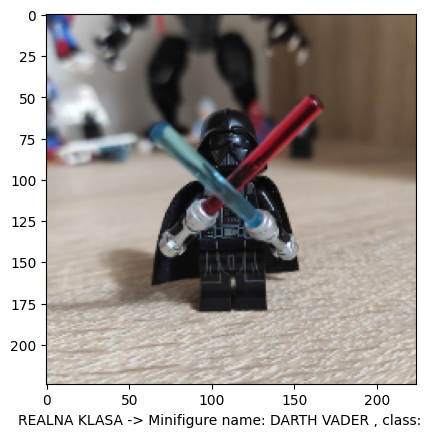

1/1 [==============================] - 0s 311ms/step
UTVRDJENA KLASA: 34 Minifigure: DARTH VADER


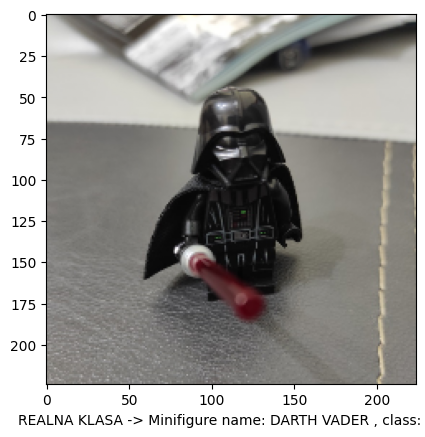

1/1 [==============================] - 0s 306ms/step
UTVRDJENA KLASA: 34 Minifigure: DARTH VADER


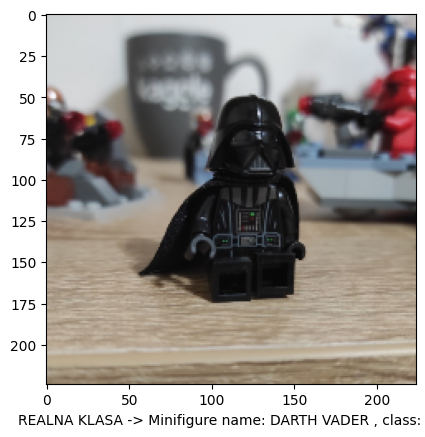

1/1 [==============================] - 0s 298ms/step
UTVRDJENA KLASA: 37 Minifigure: OBI-WAN KENOBI


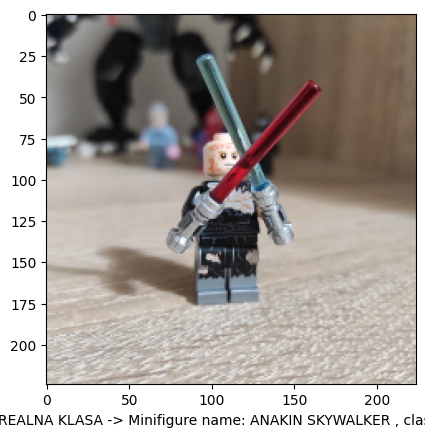

1/1 [==============================] - 0s 297ms/step
UTVRDJENA KLASA: 35 Minifigure: ANAKIN SKYWALKER


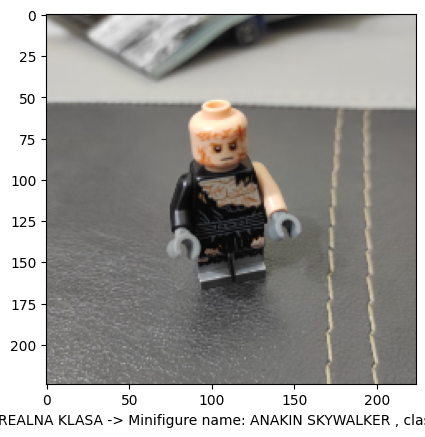

1/1 [==============================] - 0s 302ms/step
UTVRDJENA KLASA: 35 Minifigure: ANAKIN SKYWALKER


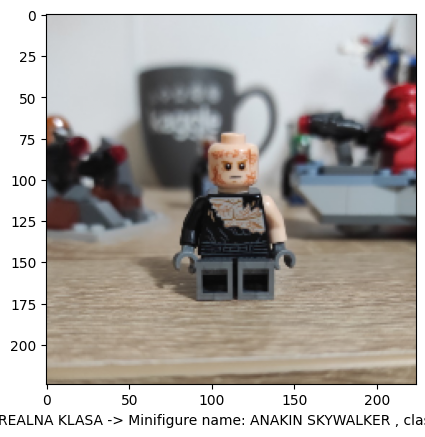

1/1 [==============================] - 0s 202ms/step
UTVRDJENA KLASA: 36 Minifigure: EMPEROR PALPATINE


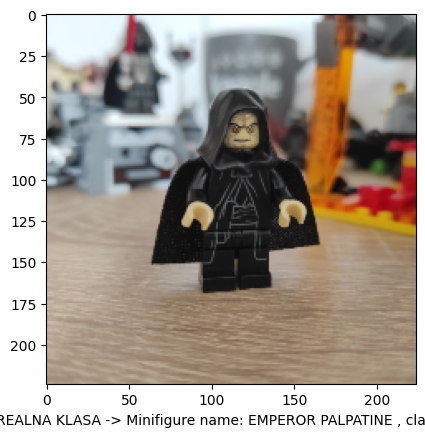

1/1 [==============================] - 0s 302ms/step
UTVRDJENA KLASA: 36 Minifigure: EMPEROR PALPATINE


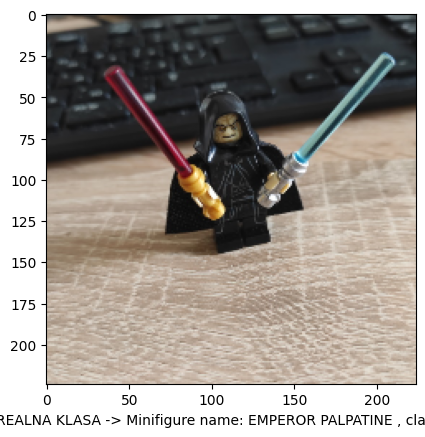

1/1 [==============================] - 0s 308ms/step
UTVRDJENA KLASA: 36 Minifigure: EMPEROR PALPATINE


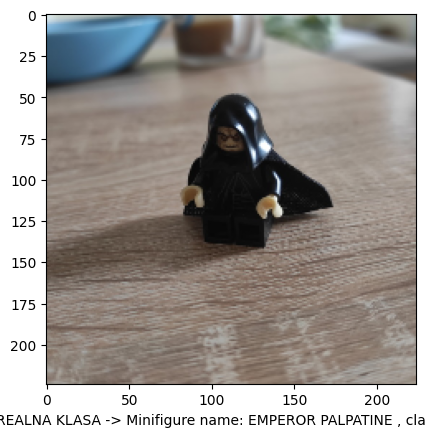

1/1 [==============================] - 0s 356ms/step
UTVRDJENA KLASA: 37 Minifigure: OBI-WAN KENOBI


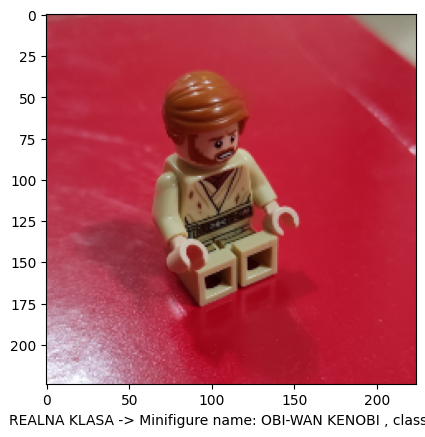

1/1 [==============================] - 0s 324ms/step
UTVRDJENA KLASA: 37 Minifigure: OBI-WAN KENOBI


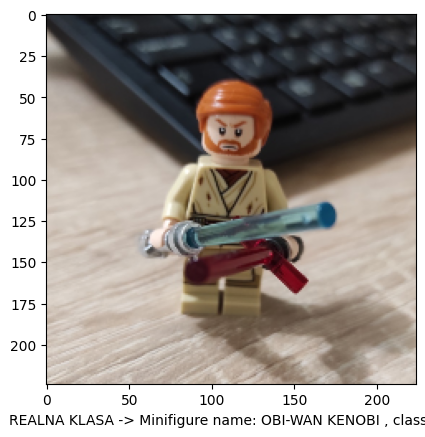

1/1 [==============================] - 0s 327ms/step
UTVRDJENA KLASA: 8 Minifigure: MACE WINDU


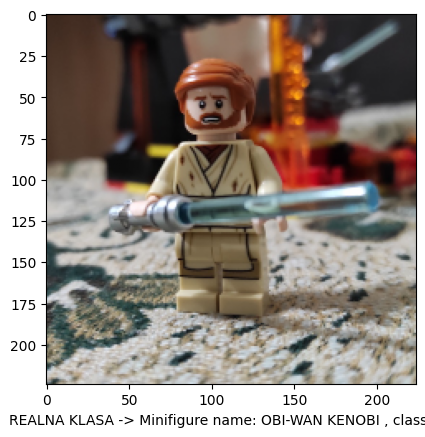

1/1 [==============================] - 0s 379ms/step
UTVRDJENA KLASA: 38 Minifigure: BOBA FETT


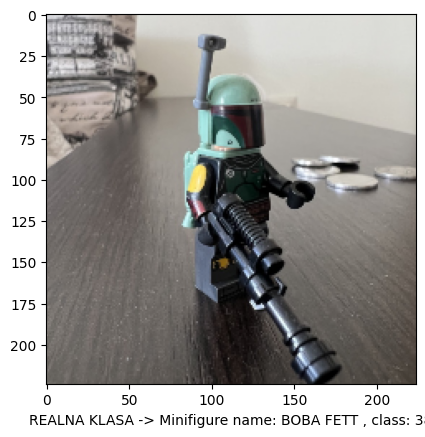

1/1 [==============================] - 0s 398ms/step
UTVRDJENA KLASA: 38 Minifigure: BOBA FETT


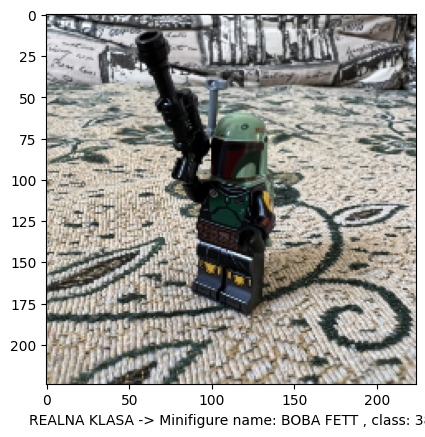

1/1 [==============================] - 0s 403ms/step
UTVRDJENA KLASA: 38 Minifigure: BOBA FETT


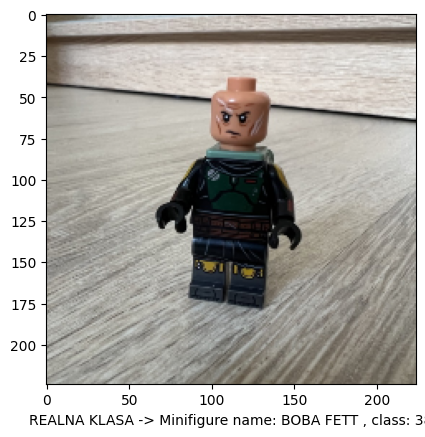

In [26]:
#U narednom delu biće pregled kako najbolji model radi na konkretnim testnim podacima

best_model=model_densenet
for i in range(len(test_df)):
    image_path=os.path.join( "/content/drive/MyDrive/project" ,X_test["path"].values[i])
    image = cv2.imread(image_path)
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)/255
    plt.imshow(image)
    plt.xlabel('REALNA KLASA -> Minifigure name: ' + test_actual_df['minifigure_name'].values[i]+' , class: '+str(test_actual_df['class_id'].values[i]))
    image = np.reshape(image, (1, 224, 224, 3))
    index_klase = best_model.predict(image).argmax()
    index_klase += 1
    minifigure = metadata_df["minifigure_name"][metadata_df["class_id"] == index_klase].iloc[0]
    print("UTVRDJENA KLASA:", str(index_klase)+ " Minifigure:",minifigure)
    plt.show()

**Zaključak**


U ovom projektu klasifikacije LEGO figura, razvijena su 3 klasifikaciona modela zasnovana na arhitekturi mreža tipa DenseNet,Inception i VGG19. Modeli su obučeni na malom skupu podataka koji sadrži različite slike LEGO minifigura. Maksimalna postignuta metrika pouzdanosti utvrđena je u Densenet modelu i iznosi 87.37%

Perfomanse su poboljšanje metodom suboptimizacije i regularizacije.

Predpostavlja se da bi se performanse svih modela bile bolje ukoliko bi skup podataka bio veći, a slike slikane na različitim pozadinama i pri različitim osvetljenjima.

Najbolje performanse pokazao je model zasnovan na Densnetu kako je on najpogodniji za male skupove podataka - njegova arhitektura omogućava maksimalno iskoriščenjne postojećih resursa. Očekivano, Inception v3 model je pokazao bolje performanse u odnosu na VGG koji je stariji i bez modernih koncepata.


Ovaj projekat ima praktičnu primenu u raznim oblastima, uključujući industriju igračaka, e-trgovine i veb-platformi posvećenih LEGO kolekcionarima..

**Reference**

1. https://www.pluralsight.com/guides/introduction-to-densenet-wi3. https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202th-tensorflow

3. https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202

2. https://blog.devgenius.io/resnet50-6b42934db431

